c:\Users\eagua\anaconda3\envs\torch_cuda\Lib\site-packages\torchvision\models\_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
c:\Users\eagua\anaconda3\envs\torch_cuda\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Processing images:   0%|          | 0/11 [00:00<?, ?it/s]

C:\Users\eagua\OneDrive\Documents\GitHub\6CCS3COV-7CCSMCVI-Computer-Vision\causal-explainer\data_demo\catdog.png


c:\Users\eagua\OneDrive\Documents\GitHub\6CCS3COV-7CCSMCVI-Computer-Vision\causal-explainer\causal-explainer\masker\generation.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  cell_size = torch.ceil(torch.tensor(self.input_size).float() / s)
Processing images:   9%|▉         | 1/11 [00:11<01:52, 11.30s/it]

C:\Users\eagua\OneDrive\Documents\GitHub\6CCS3COV-7CCSMCVI-Computer-Vision\causal-explainer\data_demo\goldfish.jpg


Processing images:  18%|█▊        | 2/11 [01:13<06:09, 41.07s/it]

C:\Users\eagua\OneDrive\Documents\GitHub\6CCS3COV-7CCSMCVI-Computer-Vision\causal-explainer\data_demo\ILSVRC2012_val_00000110.JPEG


Processing images:  27%|██▋       | 3/11 [01:26<03:47, 28.49s/it]

C:\Users\eagua\OneDrive\Documents\GitHub\6CCS3COV-7CCSMCVI-Computer-Vision\causal-explainer\data_demo\ILSVRC2012_val_00000111.JPEG


Processing images:  36%|███▋      | 4/11 [01:42<02:44, 23.57s/it]

C:\Users\eagua\OneDrive\Documents\GitHub\6CCS3COV-7CCSMCVI-Computer-Vision\causal-explainer\data_demo\ILSVRC2012_val_00000140.JPEG


Processing images:  45%|████▌     | 5/11 [01:46<01:37, 16.32s/it]

C:\Users\eagua\OneDrive\Documents\GitHub\6CCS3COV-7CCSMCVI-Computer-Vision\causal-explainer\data_demo\ILSVRC2012_val_00000269.JPEG


Processing images:  55%|█████▍    | 6/11 [01:57<01:13, 14.64s/it]

C:\Users\eagua\OneDrive\Documents\GitHub\6CCS3COV-7CCSMCVI-Computer-Vision\causal-explainer\data_demo\ILSVRC2012_val_00000617.JPEG


Processing images:  64%|██████▎   | 7/11 [02:02<00:45, 11.35s/it]

C:\Users\eagua\OneDrive\Documents\GitHub\6CCS3COV-7CCSMCVI-Computer-Vision\causal-explainer\data_demo\ILSVRC2012_val_00000796.JPEG


Processing images:  73%|███████▎  | 8/11 [02:03<00:24,  8.31s/it]

C:\Users\eagua\OneDrive\Documents\GitHub\6CCS3COV-7CCSMCVI-Computer-Vision\causal-explainer\data_demo\ILSVRC2012_val_00001207.JPEG


Processing images:  82%|████████▏ | 9/11 [02:09<00:15,  7.53s/it]

C:\Users\eagua\OneDrive\Documents\GitHub\6CCS3COV-7CCSMCVI-Computer-Vision\causal-explainer\data_demo\ILSVRC2012_val_00001279.JPEG


Processing images:  91%|█████████ | 10/11 [02:24<00:09,  9.71s/it]

C:\Users\eagua\OneDrive\Documents\GitHub\6CCS3COV-7CCSMCVI-Computer-Vision\causal-explainer\data_demo\ILSVRC2012_val_00001775.JPEG


Processing images: 100%|██████████| 11/11 [02:26<00:00, 13.29s/it]


Calculating relevance scores, please wait... This may take a while.


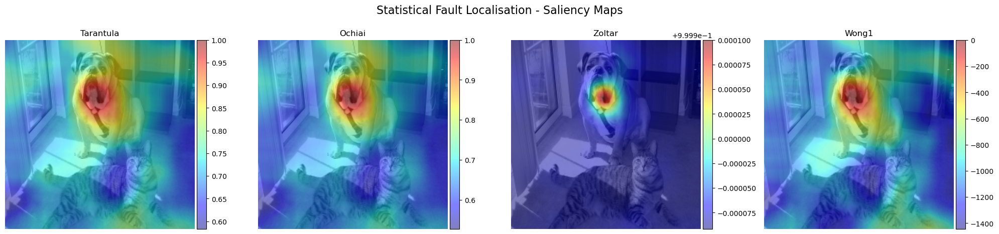

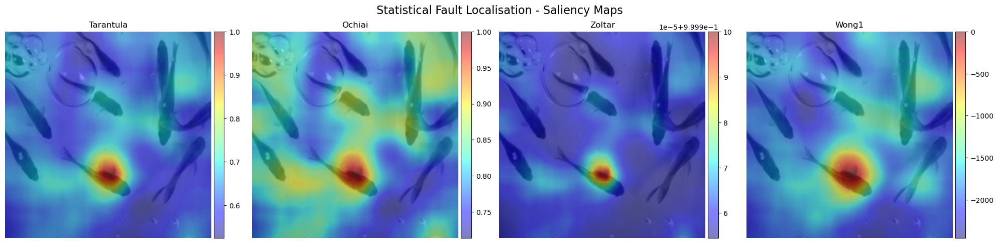

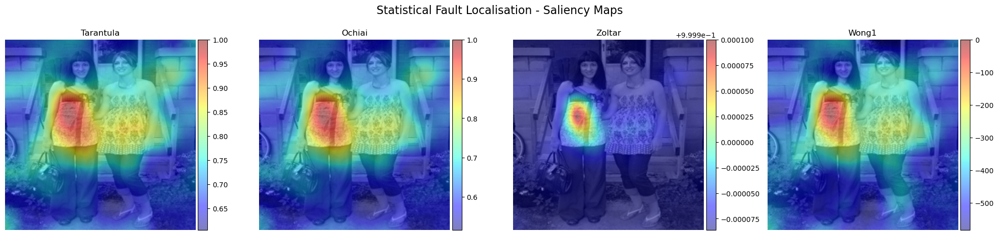

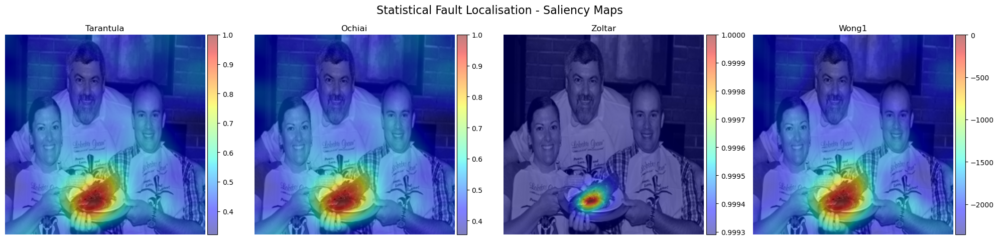

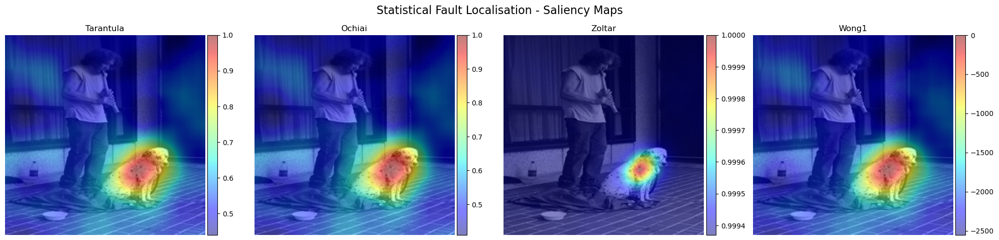

...

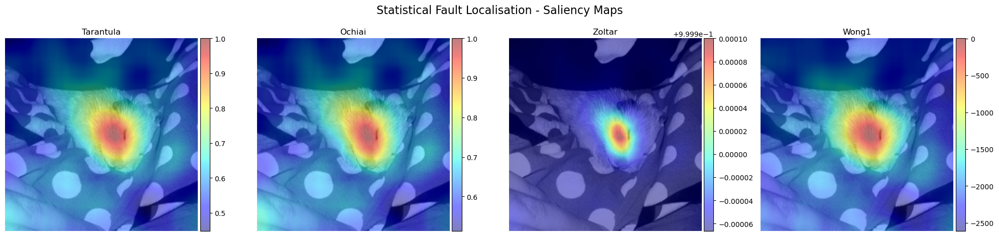

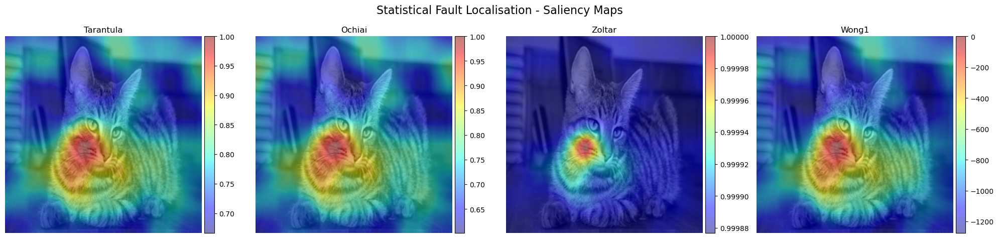

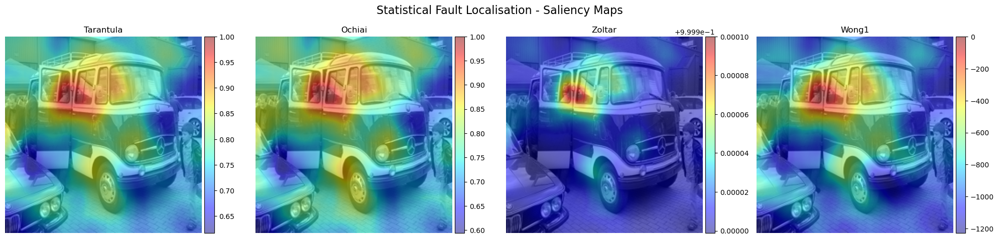

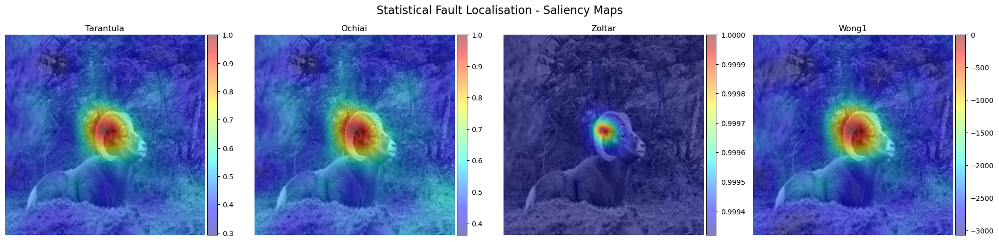

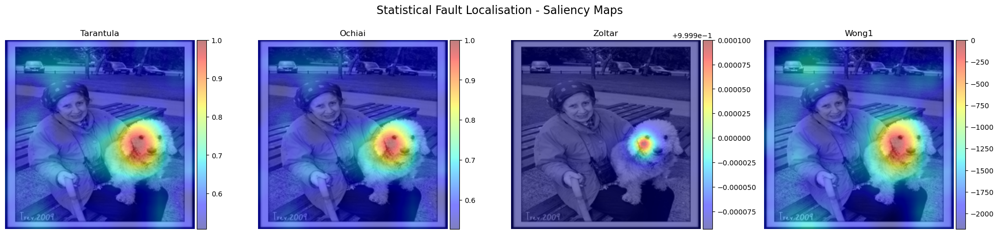

In [2]:
import torch.nn as nn
import torchvision.models as models
from explainer import batch
# Load the ResNet50 model with the latest weights
model = models.resnet50(True)
model = nn.Sequential(model, nn.Softmax(dim=1))
model = model.eval().cuda()
for p in model.parameters():
    p.requires_grad = False

''' '''

image_folder = r"C:\Users\eagua\OneDrive\Documents\GitHub\6CCS3COV-7CCSMCVI-Computer-Vision\causal-explainer\data_demo"
N = 100 # Number of mutations

results = batch(model, image_folder, N)
# Now you can access all the results from the 'results' dictionary



In [1]:
import torch
from typing import Dict, List
import ollama

class Agent:
    def __init__(self, name):
        self.name = name

    def process(self, input_data):
        raise NotImplementedError

class UserInterfaceAgent(Agent):
    def __init__(self):
        super().__init__("User Interface Agent")

    def process(self, user_query: str) -> List[str]:
        prompt = f"Extract key medical terms from this query: {user_query}"
        response = ollama.generate(model='gemma', prompt=prompt)
        return response['response'].strip().split(', ')

ModuleNotFoundError: No module named 'ollama'

In [ ]:
class ModelSelectionAgent(Agent):
    def __init__(self, model_mapping: Dict[str, torch.nn.Module]):
        super().__init__("Model Selection Agent")
        self.model_mapping = model_mapping

    def process(self, keywords: List[str]) -> torch.nn.Module:
        key = " ".join(keywords).lower()
        return self.model_mapping.get(key, None)

In [ ]:
class ExplainableAIAgent(Agent):
    def __init__(self):
        super().__init__("Explainable AI Agent")

    def process(self, model: torch.nn.Module, img: torch.Tensor, N: int) -> torch.Tensor:
        from explainer import batch  # Assuming you have a PyTorch-compatible explainer
        return batch(model, img, N)


In [ ]:
class ResultInterpretationAgent(Agent):
    def __init__(self):
        super().__init__("Result Interpretation Agent")

    def process(self, saliency_map: torch.Tensor, query: str) -> str:
        prompt = f"""You are a medical AI assistant. Interpret the saliency map and answer the user's query.
        Query: {query}
        Saliency Map: {saliency_map.tolist()}
        Please interpret the results and answer the query."""
        response = ollama.generate(model='gemma', prompt=prompt)
        return response['response']

In [ ]:
class Orchestrator:
    def __init__(self, model_mapping: Dict[str, torch.nn.Module]):
        self.ui_agent = UserInterfaceAgent()
        self.model_selection_agent = ModelSelectionAgent(model_mapping)
        self.explainable_ai_agent = ExplainableAIAgent()
        self.result_interpretation_agent = ResultInterpretationAgent()

    def process_query(self, query: str, img: torch.Tensor) -> str:
        keywords = self.ui_agent.process(query)
        model = self.model_selection_agent.process(keywords)
        
        if not model:
            return "I'm sorry, I couldn't find a suitable model for your query."
        
        saliency_map = self.explainable_ai_agent.process(model, img, N=5)
        explanation = self.result_interpretation_agent.process(saliency_map, query)
        
        return explanation

def load_model(file_path: str) -> torch.nn.Module:
    return torch.load(file_path)

MODEL_MAPPING: Dict[str, torch.nn.Module] = {
    "lung cancer mri": load_model("path/to/lung_cancer_mri_model.pth"),
    "brain tumor mri": load_model("path/to/brain_tumor_mri_model.pth"),
    # ... add more models here
}

In [ ]:
orchestrator = Orchestrator(MODEL_MAPPING)
user_query = "Why is my MRI detecting lung cancer?"
mri_image = load_mri_image()  # You'll need to implement this function to return a torch.Tensor
result = orchestrator.process_query(user_query, mri_image)
print(result)

SyntaxError: incomplete input (2435098975.py, line 43)